**Group information**

| Family name | First name | Email address            |
| ----------- | ---------- | ------------------------ |
| Yuzkiv      | Viktoriia  | viktoriia.yuzkiv@bse.eu  |
| Di Gianvito  | Angelo     | angelo.digianvito@bse.eu |


# Developing a YOLOv8-Based Model for Automated Detection of Military Vehicles

## Motivation

In the digital age, the accurate and timely identification of military vehicles in news imagery is critical for a variety of applications, including media analysis, conflict monitoring, and historical archiving. By developing a robust model based on YOLOv8 for detecting military vehicles, we can significantly enhance the capabilities of automated systems to analyze media coverage of conflicts. This technology can be used to quantify the presence of military vehicles in news images, thereby serving as a proxy for understanding the intensity and focus of media reporting on wars and conflicts.


## Dataset

The dataset used for this task: [Military Decision-Making Dataset](https://www.kaggle.com/datasets/nzigulic/military-equipment)

The dataset comprises 11,800 images and labels tailored for the YOLO detection algorithm, categorizing objects as follows:

1. Tank (TANK)
2. Infantry fighting vehicle (IFV)
3. Armored personnel carrier (APC)
4. Engineering vehicle (EV)
5. Assault helicopter (AH)
6. Transport helicopter (TH)
7. Assault airplane (AAP)
8. Transport airplane (TA)
9. Anti-aircraft vehicle (AA)
10. Towed artillery (TART)
11. Self-propelled artillery (SPART)

## Model

We will utilize a pre-trained YOLOv8 model, renowned for its state-of-the-art object detection capabilities. YOLOv8 excels in accuracy and precision, which is critical for accurately identifying various military vehicles. Its robustness allows it to detect a wide range of objects under diverse conditions, making it ideal for the varied environments in military applications. By leveraging pretrained models, we can efficiently fine-tune the model for our specific dataset, significantly reducing training time and computational resources while maintaining high performance.

## Environment Setup

In [4]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [6]:
import ultralytics
ultralytics.checks()

from ultralytics import YOLO
import yaml

from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import glob
import os
import cv2
import torch

from IPython.display import Image, clear_output, display
from IPython import display
%matplotlib inline

Ultralytics 8.3.235 🚀 Python-3.13.5 torch-2.9.1 CPU (Apple M4 Pro)
Setup complete ✅ (14 CPUs, 24.0 GB RAM, 202.6/460.4 GB disk)


## Data Preparation

We will create a data.yaml file required for configuring the YOLOv8 model. Our dataset has been restructured to follow the standard YOLO format, organized as follows:
- test
    - images
    - labels
- train
    - images
    - labels
- valid
    - images
    - labels

In [6]:
# Create a data.yaml file for the YOLO model

# Define the data
data = {
    'train': '/kaggle/input/datasetmilitaryequipment/train',
    'val': '/kaggle/input/datasetmilitaryequipment/valid',
    'test': '/kaggle/input/datasetmilitaryequipment/test',
    'nc': 11,
    'names': ['TANK', 'IFV', 'APC', 'EV', 'AH', 'TH', 'AAP', 'TA', 'AA', 'TART', 'SPART']
}

# Specify the file name
file_name = 'data.yaml'

# Write the data to a YAML file
with open(file_name, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f'{file_name} created successfully.')


data.yaml created successfully.


We will start by examining a few sample images from our dataset to get an idea of how the data looks like. After that, we will analyze the class distribution to understand how many instances of each military vehicle category are present in the dataset. 

In [7]:
class MilitaryVehiclesDataset(Dataset):
    def __init__(self, images_dir, labels_dir, img_size=640, transform=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.img_size = img_size
        self.transform = transform
        self.image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg') or f.endswith('.png')]
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.images_dir, self.image_files[idx])
        label_path = os.path.join(self.labels_dir, self.image_files[idx].replace('.jpg', '.txt').replace('.png', '.txt'))
        
        # Load image using OpenCV
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Resize image to img_size
        img = cv2.resize(img, (self.img_size, self.img_size))
        
        # Normalize image to range [0, 1]
        img = img.astype(np.float32) / 255.0
        
        # Load bounding boxes and labels
        boxes, labels = self.load_annotations(label_path)
        
        # Apply transformations if provided
        if self.transform:
            img, boxes = self.transform(img, boxes)
        
        # Convert everything to tensors
        img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)  # CHW format
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.long)
        
        return img, boxes, labels
    
    def load_annotations(self, label_path):
        boxes = []
        labels = []
        
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                label = int(parts[0])
                bbox = [float(x) for x in parts[1:]]
                
                # Append to list
                boxes.append(bbox)
                labels.append(label)
        
        return boxes, labels
    

def collate_fn(batch):
    """
    Custom collate function to handle varying number of bounding boxes per image.
    """
    imgs = []
    boxes_list = []
    labels_list = []

    for img, boxes, labels in batch:
        imgs.append(img)
        boxes_list.append(boxes)
        labels_list.append(labels)

    imgs = torch.stack(imgs, dim=0) if imgs else None
    return imgs, boxes_list, labels_list


def get_data_loader(images_dir, labels_dir, batch_size=4, shuffle=True, img_size=640, transform=None):
    dataset = MilitaryVehiclesDataset(images_dir, labels_dir, img_size=img_size, transform=transform)
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, collate_fn=collate_fn)

In [8]:
def plot_examples(data_loader, class_names, num_examples=5, images_per_row=4):
    images, boxes_list, labels_list = next(iter(data_loader))
    
    # Calculate number of rows needed
    num_rows = (num_examples + images_per_row - 1) // images_per_row  # This ensures we round up

    fig, axs = plt.subplots(num_rows, images_per_row, figsize=(20, 5 * num_rows))
    axs = axs.flatten()  # Flatten to easily index the axes

    for i in range(num_examples):
        image = images[i].permute(1, 2, 0).numpy()
        boxes = boxes_list[i]
        labels = labels_list[i]
        
        image = image * 255  # Denormalize to [0, 255]
        image = image.astype(np.uint8)
        
        axs[i].imshow(image)
        axs[i].axis('off')
        
        for box, label in zip(boxes, labels):
            x_center, y_center, width, height = box
            x_min = (x_center - width / 2) * image.shape[1]
            y_min = (y_center - height / 2) * image.shape[0]
            width *= image.shape[1]
            height *= image.shape[0]
            
            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='r', facecolor='none')
            axs[i].add_patch(rect)
            axs[i].text(x_min, y_min, class_names[label], bbox=dict(facecolor='yellow', alpha=0.5))
    
    # Hide any unused subplots
    for j in range(num_examples, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

In [9]:
# Class names corresponding to the dataset labels
class_names = ['TANK', 'IFV', 'APC', 'EV', 'AH', 'TH', 'AAP', 'TA', 'AA', 'TART', 'SPART']

images_train_dir = "/kaggle/input/datasetmilitaryequipment/train/images"
labels_train_dir = "/kaggle/input/datasetmilitaryequipment/train/labels"
images_val_dir = "/kaggle/input/datasetmilitaryequipment/valid/images"
labels_val_dir = "/kaggle/input/datasetmilitaryequipment/valid/labels"
images_test_dir = "/kaggle/input/datasetmilitaryequipment/test/images"
labels_test_dir = "/kaggle/input/datasetmilitaryequipment/test/labels"

batch_size = 16

# Create data loaders
train_loader = get_data_loader(images_train_dir, labels_train_dir, batch_size=batch_size, shuffle=True, img_size=640)
val_loader = get_data_loader(images_val_dir, labels_val_dir, batch_size=batch_size, shuffle=False, img_size=640)
test_loader = get_data_loader(images_test_dir, labels_test_dir, batch_size=batch_size, shuffle=False, img_size=640)

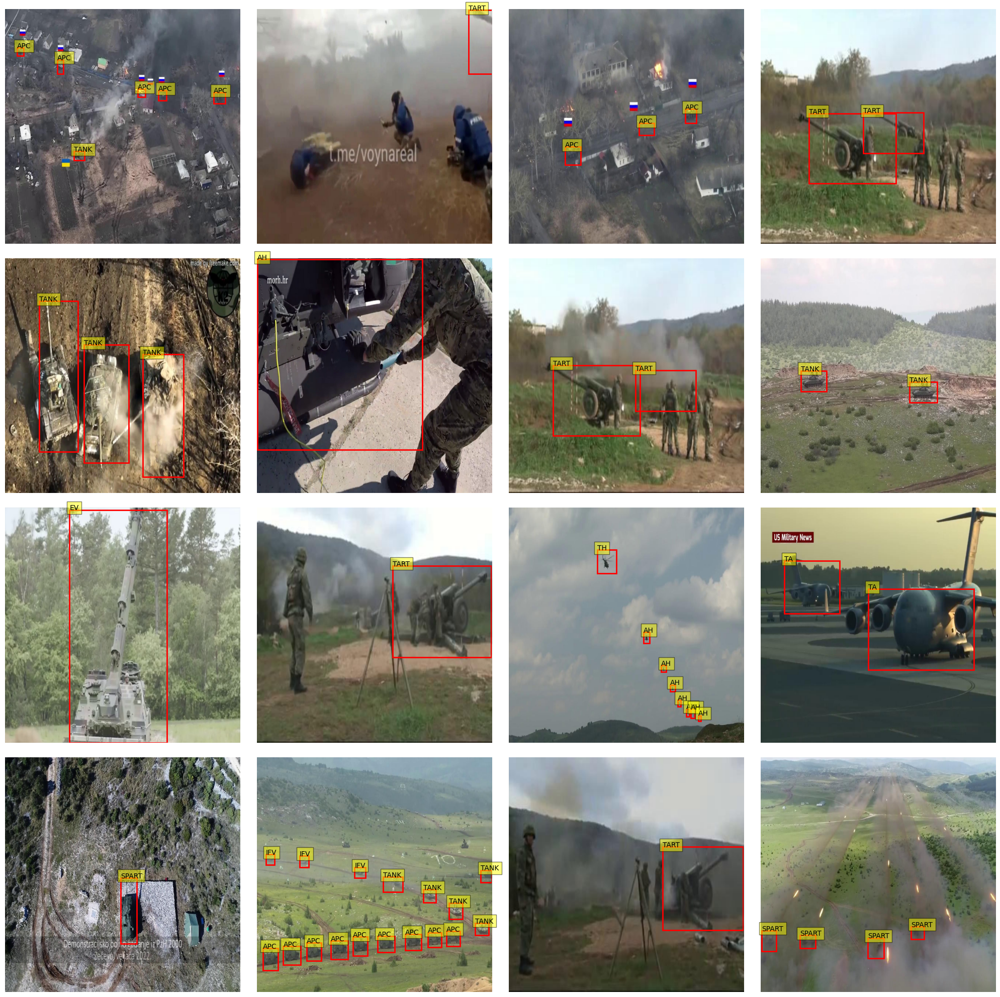

In [10]:
# Plot examples from the train dataset
plot_examples(train_loader, class_names, num_examples=16, images_per_row=4)

The examples of images displayed above illustrate that the dataset comprises real conflict zone scenarios. Military vehicles are depicted in various contexts and sizes, providing a diverse set of conditions that will be beneficial for training a robust detection model. This diversity ensures that the YOLOv8 model will be well-equipped to accurately identify and classify military vehicles in a wide range of real-world situations.

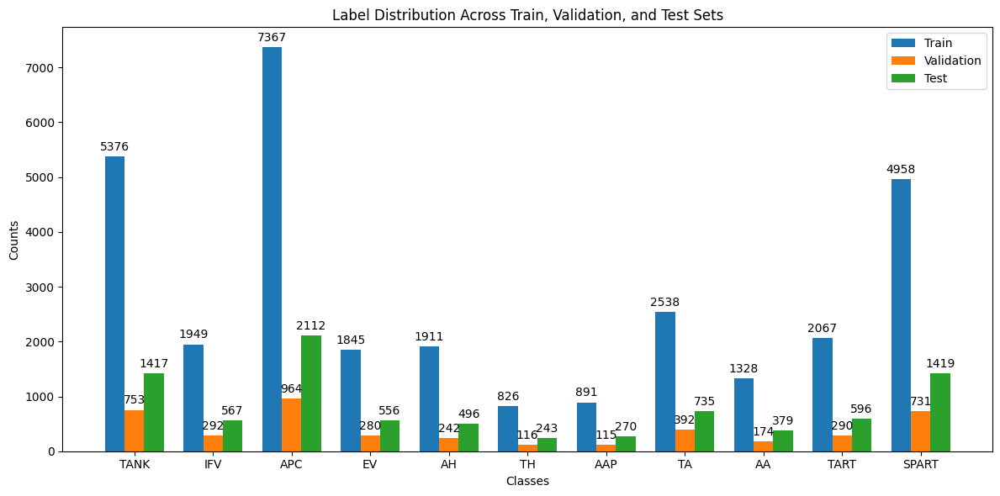

In [11]:
def count_labels(labels_dir):
    label_counts = [0] * len(class_names)
    for label_file in os.listdir(labels_dir):
        if label_file.endswith('.txt'):
            with open(os.path.join(labels_dir, label_file), 'r') as f:
                for line in f:
                    label = int(line.strip().split()[0])
                    label_counts[label] += 1
    return label_counts

def plot_label_distribution(train_counts, val_counts, test_counts, class_names):
    x = np.arange(len(class_names))  # the label locations
    width = 0.25  # the width of the bars

    fig, ax = plt.subplots(figsize=(12, 6))
    rects1 = ax.bar(x - width, train_counts, width, label='Train')
    rects2 = ax.bar(x, val_counts, width, label='Validation')
    rects3 = ax.bar(x + width, test_counts, width, label='Test')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_xlabel('Classes')
    ax.set_ylabel('Counts')
    ax.set_title('Label Distribution Across Train, Validation, and Test Sets')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names)
    ax.legend()

    # Function to add the count labels on top of the bars
    def autolabel(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate('{}'.format(height),
                        xy=(rect.get_x() + rect.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    autolabel(rects1)
    autolabel(rects2)
    autolabel(rects3)

    fig.tight_layout()
    plt.show()


# Count labels for each dataset split
train_label_counts = count_labels(labels_train_dir)
val_label_counts = count_labels(labels_val_dir)
test_label_counts = count_labels(labels_test_dir)

# Plot the label distributions
plot_label_distribution(train_label_counts, val_label_counts, test_label_counts, class_names)

In the plot above we can see that APC and TANK are the most frequently occurring classes across all sets. 

The validation and test sets have the same distribution of class instances, which is good for evaluating the model's performance consistently.

## YOLOv8 Model Fine-Tuning

To adapt the pre-trained YOLOv8 model for military vehicle detection, we will fine-tune it on our specific dataset of 11,800 labeled images.

In [22]:
# Load the pre-trained model
model = YOLO()

# Fine-tune the model
model.train(
    data="/kaggle/working/data.yaml",
    imgsz=640,
    epochs=50,
    batch=16,
    name='yolov8_military_vehicles')

Ultralytics YOLOv8.2.39 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8_military_vehicles, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tru

100%|██████████| 755k/755k [00:00<00:00, 41.5MB/s]
2024-06-22 16:05:55,685	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-06-22 16:05:56,967	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=11

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /kaggle/input/datasetmilitaryequipment/train/labels... 11768 images, 0 backgrounds, 418 corrupt: 100%|██████████| 11768/11768 [00:38<00:00, 305.96it/s]

train: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/train/images/1328.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0246]
train: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/train/images/1329.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0582]
train: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/train/images/1330.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0586]
train: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/train/images/1642.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0208]
train: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/train/images/17720.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0193]
train: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/train/images/17721.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [   

train: WARNING ⚠️ Cache directory /kaggle/input/datasetmilitaryequipment/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/datasetmilitaryequipment/valid/labels... 1680 images, 0 backgrounds, 53 corrupt: 100%|██████████| 1680/1680 [00:04<00:00, 347.17it/s]

val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/1225.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0316]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17733.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0255]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17743.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0307]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17746.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0312]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17760.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0338]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17771.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0338]

val: WARNING ⚠️ Cache directory /kaggle/input/datasetmilitaryequipment/valid is not writeable, cache not saved.
Plotting labels to runs/detect/yolov8_military_vehicles/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yolov8_military_vehicles
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.35G       1.74      2.444      1.412         18        640: 100%|██████████| 710/710 [02:24<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:10<00:00,  4.81it/s]


                   all       1627       3941      0.819      0.751      0.817      0.467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.33G      1.477      1.333      1.248         19        640: 100%|██████████| 710/710 [02:16<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.63it/s]


                   all       1627       3941      0.896      0.807      0.876      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.36G      1.376      1.032      1.195         44        640: 100%|██████████| 710/710 [02:13<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.83it/s]


                   all       1627       3941       0.87      0.807      0.875      0.536

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.36G      1.304     0.8921      1.163         24        640: 100%|██████████| 710/710 [02:11<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.78it/s]


                   all       1627       3941      0.921       0.88       0.93      0.606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.32G      1.233     0.7968      1.129         47        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.57it/s]


                   all       1627       3941      0.909      0.866      0.919      0.602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.36G      1.189     0.7448      1.109         29        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.71it/s]


                   all       1627       3941      0.933      0.896      0.937      0.641

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.32G      1.142     0.6941      1.089         18        640: 100%|██████████| 710/710 [02:12<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.53it/s]


                   all       1627       3941      0.937      0.905      0.938      0.652

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.36G      1.103     0.6629      1.073         41        640: 100%|██████████| 710/710 [02:12<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.79it/s]


                   all       1627       3941      0.935      0.912      0.948      0.669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.32G      1.077      0.635      1.062         32        640: 100%|██████████| 710/710 [02:12<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.50it/s]


                   all       1627       3941      0.951      0.908       0.95      0.682

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.36G      1.055     0.6188      1.054         32        640: 100%|██████████| 710/710 [02:12<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.69it/s]


                   all       1627       3941       0.95      0.909      0.949      0.675

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.32G       1.03     0.5982      1.043         28        640: 100%|██████████| 710/710 [02:13<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.70it/s]


                   all       1627       3941      0.955      0.919      0.956        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.36G       1.01     0.5799      1.034         32        640: 100%|██████████| 710/710 [02:12<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.72it/s]


                   all       1627       3941      0.946      0.925      0.955      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.32G     0.9955     0.5686      1.032         26        640: 100%|██████████| 710/710 [02:12<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.84it/s]


                   all       1627       3941      0.955       0.92      0.957      0.704

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.36G     0.9833     0.5585      1.025         22        640: 100%|██████████| 710/710 [02:12<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.44it/s]


                   all       1627       3941      0.966      0.918      0.964      0.714

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.37G     0.9675     0.5451      1.017         36        640: 100%|██████████| 710/710 [02:12<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.71it/s]

                   all       1627       3941      0.959      0.925      0.963      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.36G     0.9517     0.5383      1.013         23        640: 100%|██████████| 710/710 [02:12<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.43it/s]


                   all       1627       3941      0.956      0.924      0.964      0.725

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.32G     0.9344     0.5253      1.006         17        640: 100%|██████████| 710/710 [02:12<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.59it/s]


                   all       1627       3941      0.954      0.929      0.967      0.738

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.36G     0.9228     0.5175      1.004         16        640: 100%|██████████| 710/710 [02:13<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.64it/s]


                   all       1627       3941      0.959      0.931      0.964      0.736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.32G     0.9103     0.5068     0.9943         26        640: 100%|██████████| 710/710 [02:12<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.80it/s]


                   all       1627       3941      0.966      0.926      0.969      0.744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.36G     0.8987      0.502     0.9908         24        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.74it/s]


                   all       1627       3941      0.967      0.925      0.964       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.32G     0.8922     0.4954     0.9887         37        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.71it/s]


                   all       1627       3941      0.967      0.928      0.971      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.36G      0.873     0.4852     0.9814         48        640: 100%|██████████| 710/710 [02:11<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.65it/s]

                   all       1627       3941      0.972      0.934      0.972      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.32G     0.8696     0.4813      0.979         24        640: 100%|██████████| 710/710 [02:11<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.58it/s]

                   all       1627       3941      0.966      0.939      0.971      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.37G     0.8622     0.4767     0.9775         43        640: 100%|██████████| 710/710 [02:12<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.83it/s]


                   all       1627       3941      0.969      0.934      0.971      0.756

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.32G     0.8532     0.4733     0.9761         24        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.65it/s]


                   all       1627       3941      0.971      0.933      0.973      0.765

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.36G      0.847     0.4636     0.9734         29        640: 100%|██████████| 710/710 [02:12<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.77it/s]


                   all       1627       3941      0.964      0.939      0.971      0.768

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.32G     0.8364     0.4583     0.9684         28        640: 100%|██████████| 710/710 [02:11<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.68it/s]


                   all       1627       3941      0.963      0.941      0.977      0.771

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.36G     0.8281     0.4547     0.9663         33        640: 100%|██████████| 710/710 [02:12<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.75it/s]


                   all       1627       3941      0.972      0.928      0.972      0.771

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.32G      0.828     0.4533     0.9636         39        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.89it/s]


                   all       1627       3941      0.972      0.936      0.974      0.776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.36G     0.8117      0.443     0.9571         21        640: 100%|██████████| 710/710 [02:12<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.58it/s]


                   all       1627       3941      0.976      0.934      0.976       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.32G     0.8052     0.4426     0.9589         33        640: 100%|██████████| 710/710 [02:11<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.83it/s]


                   all       1627       3941      0.973      0.937      0.976      0.781

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.36G     0.8003     0.4371     0.9547         28        640: 100%|██████████| 710/710 [02:13<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.42it/s]


                   all       1627       3941      0.975      0.937      0.976      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.32G     0.7874     0.4302     0.9517         15        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.78it/s]


                   all       1627       3941      0.971       0.94      0.976      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.36G     0.7834     0.4253     0.9495         38        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.76it/s]


                   all       1627       3941      0.972      0.939      0.978      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.32G     0.7722     0.4206     0.9432         27        640: 100%|██████████| 710/710 [02:12<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.64it/s]


                   all       1627       3941      0.972      0.943      0.979      0.791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.36G     0.7644     0.4145     0.9417         32        640: 100%|██████████| 710/710 [02:14<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.65it/s]

                   all       1627       3941      0.958      0.952      0.978      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.32G     0.7584     0.4146     0.9405         29        640: 100%|██████████| 710/710 [02:13<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.79it/s]

                   all       1627       3941      0.971      0.942      0.978      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.36G     0.7541     0.4102     0.9391         21        640: 100%|██████████| 710/710 [02:12<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.82it/s]

                   all       1627       3941      0.972      0.944      0.978      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.32G      0.744     0.4054     0.9361         21        640: 100%|██████████| 710/710 [02:12<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.68it/s]

                   all       1627       3941      0.968      0.947      0.978      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.36G     0.7398     0.4007     0.9321         24        640: 100%|██████████| 710/710 [02:12<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.44it/s]


                   all       1627       3941      0.968      0.949      0.979      0.797
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.32G     0.7182     0.3716      0.919         11        640: 100%|██████████| 710/710 [02:13<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.66it/s]


                   all       1627       3941      0.972      0.945      0.979      0.796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.36G     0.7049      0.363     0.9137          9        640: 100%|██████████| 710/710 [02:10<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.75it/s]


                   all       1627       3941      0.975      0.944       0.98      0.799

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.32G      0.691     0.3561     0.9083          8        640: 100%|██████████| 710/710 [02:10<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.76it/s]

                   all       1627       3941      0.972      0.946       0.98      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.36G     0.6804     0.3515     0.9054         21        640: 100%|██████████| 710/710 [02:10<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.63it/s]


                   all       1627       3941      0.972      0.948       0.98      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.32G     0.6719      0.347     0.9041          9        640: 100%|██████████| 710/710 [02:10<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.87it/s]

                   all       1627       3941      0.969      0.949       0.98      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.36G     0.6634     0.3428     0.9037          9        640: 100%|██████████| 710/710 [02:10<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.71it/s]

                   all       1627       3941      0.978      0.944      0.981      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.32G     0.6587     0.3394     0.9004         18        640: 100%|██████████| 710/710 [02:10<00:00,  5.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.85it/s]


                   all       1627       3941      0.977      0.943      0.981       0.81

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.36G     0.6479     0.3352     0.8963          9        640: 100%|██████████| 710/710 [02:11<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.81it/s]

                   all       1627       3941      0.973      0.947      0.981      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.32G     0.6427     0.3318     0.8941         10        640: 100%|██████████| 710/710 [02:11<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:09<00:00,  5.55it/s]

                   all       1627       3941      0.981      0.941      0.981      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.36G     0.6392     0.3297     0.8947         12        640: 100%|██████████| 710/710 [02:11<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.70it/s]


                   all       1627       3941      0.979      0.942      0.981      0.811

50 epochs completed in 1.984 hours.
Optimizer stripped from runs/detect/yolov8_military_vehicles/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8_military_vehicles/weights/best.pt, 6.2MB

Validating runs/detect/yolov8_military_vehicles/weights/best.pt...
Ultralytics YOLOv8.2.39 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3007793 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.32it/s]


                   all       1627       3941      0.981      0.941      0.981      0.812
                  TANK        288        663      0.995      0.978      0.993      0.851
                   IFV        117        229      0.995       0.96      0.993       0.86
                   APC        183        775       0.97      0.964      0.987      0.851
                    EV        245        280      0.998          1      0.995      0.911
                    AH         84        242      0.977       0.76      0.926      0.619
                    TH         83        116      0.968      0.966      0.992      0.756
                   AAP         80        115      0.964      0.926      0.971       0.68
                    TA        158        359      0.995      0.997      0.995      0.925
                    AA         56        153      0.987      0.961      0.992      0.898
                  TART        214        289      0.977      0.958      0.984      0.855
                 SPAR

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cdd44270580>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.

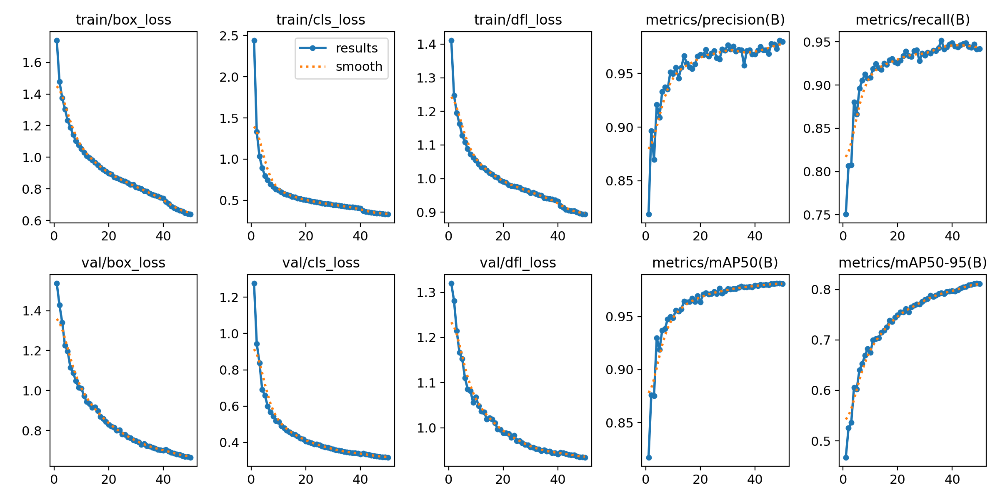

In [29]:
# Training graphs
Image(filename=f'/kaggle/working/runs/detect/yolov8_military_vehicles/results.png', width=900)

In the model outputs, we can see that training losses decrease steadily across epochs, indicating that the model is learning and improving over time. Both val/box_loss and val/cls_loss decrease over time, reflecting improvements in the model’s performance on the validation set as well.

In our case, it is important to look at mAP50 and mAP50-95 since these metrics provide a comprehensive evaluation of the model’s detection performance at various IoU thresholds. Over 50 trained epochs, we can significant improvement in the mAP50 and mAP50-95 metrics, suggesting better overall detection performance. For instance, mAP50 rises from 0.81719 to 0.91880, and mAP50-95 increases from 0.46732 to 0.60233 by the fifth epoch.

In [31]:
# Get performance on the val set
path_best_weights="/kaggle/working/runs/detect/yolov8_military_vehicles/weights/best.pt"
model_best = YOLO(path_best_weights) 

metrics = model_best.val()

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")    
print(f"Mean Average Precision @ .50   : {metrics.box.map50}") 
print(f"Mean Average Precision @ .75   : {metrics.box.map75}")

Ultralytics YOLOv8.2.39 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3007793 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/input/datasetmilitaryequipment/valid/labels... 1680 images, 0 backgrounds, 53 corrupt: 100%|██████████| 1680/1680 [00:02<00:00, 761.77it/s]

val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/1225.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0316]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17733.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0255]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17743.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0307]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17746.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0312]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17760.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0338]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/valid/images/17771.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0338]

val: WARNING ⚠️ Cache directory /kaggle/input/datasetmilitaryequipment/valid is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 102/102 [00:13<00:00,  7.84it/s]


                   all       1627       3941      0.981      0.941      0.981      0.812
                  TANK        288        663      0.995      0.977      0.993      0.852
                   IFV        117        229      0.995       0.96      0.993      0.861
                   APC        183        775      0.968      0.963      0.987      0.853
                    EV        245        280      0.998          1      0.995       0.91
                    AH         84        242      0.979       0.76      0.928      0.624
                    TH         83        116      0.968      0.966      0.992      0.753
                   AAP         80        115      0.964      0.926      0.971      0.679
                    TA        158        359      0.995      0.997      0.995      0.923
                    AA         56        153      0.987      0.961      0.992        0.9
                  TART        214        289      0.977      0.958      0.984      0.854
                 SPAR

Looking at the results from the validation set, our fine-tuned YOLOv8 model performs well in detecting military vehicles. 

Precision and recall exhibit high performance across all classes: 0.981 precision and 0.941 recall. Moreover, mAP50-95 is a very important metric as it ensures the model's robustness across different IoU thresholds. Overall mAP50-95 is 0.812 with some variance between the classes: classes AH and AAP demonstrate lower performance (0.624 and 0.679 respectively), while EV has the highest mAP50-95.

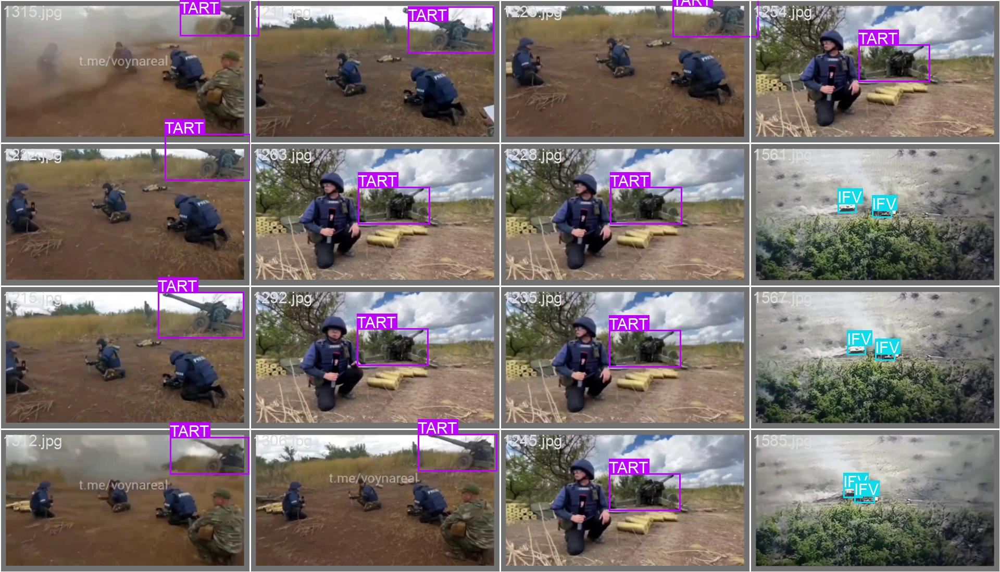

In [42]:
# Check some of the validation images (labels)
Image(filename=f'/kaggle/working/runs/detect/yolov8_military_vehicles/val_batch0_labels.jpg', width=900)

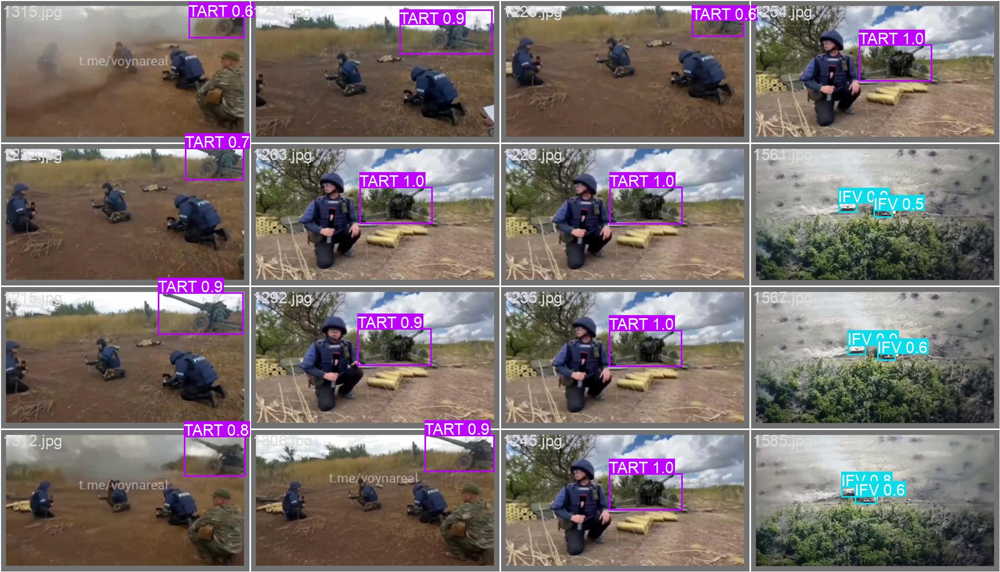

In [43]:
# Check some of the validation images (predictions)
Image(filename=f'/kaggle/working/runs/detect/yolov8_military_vehicles/val_batch0_pred.jpg', width=900)

In [44]:
# Generate predictions for the test set
!yolo task=detect \
    mode=predict \
    model=/kaggle/working/runs/detect/yolov8_military_vehicles/weights/best.pt \
    conf=0.25 \
    source=/kaggle/input/datasetmilitaryequipment/test/images

Ultralytics YOLOv8.2.39 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3007793 parameters, 0 gradients, 8.1 GFLOPs

image 1/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000793.png: 384x640 1 APC, 80.2ms
image 2/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000794.png: 384x640 1 APC, 7.4ms
image 3/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000800.png: 384x640 1 APC, 7.0ms
image 4/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000801.png: 384x640 1 APC, 7.1ms
image 5/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000805.png: 384x640 1 APC, 7.1ms
image 6/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000810.png: 384x640 1 APC, 8.1ms
image 7/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000812.png: 384x640 1 APC, 7.0ms
image 8/3361 /kaggle/input/datasetmilitaryequipment/test/images/00000815.png: 384x640 1 APC, 7.1ms
image 9/3361 /kaggle/input/dataset

Let's examine the predictions made on the test set:

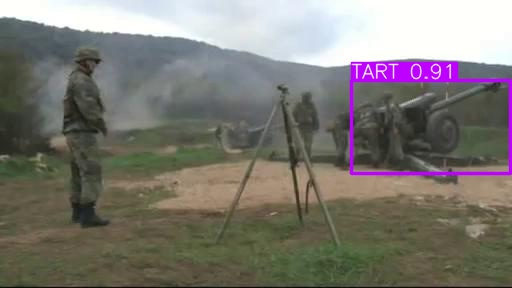

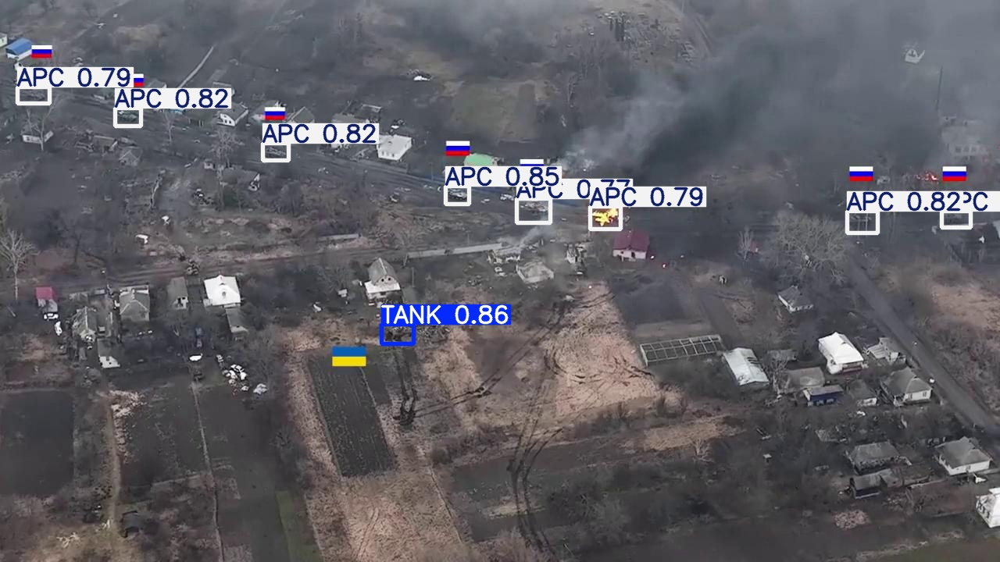

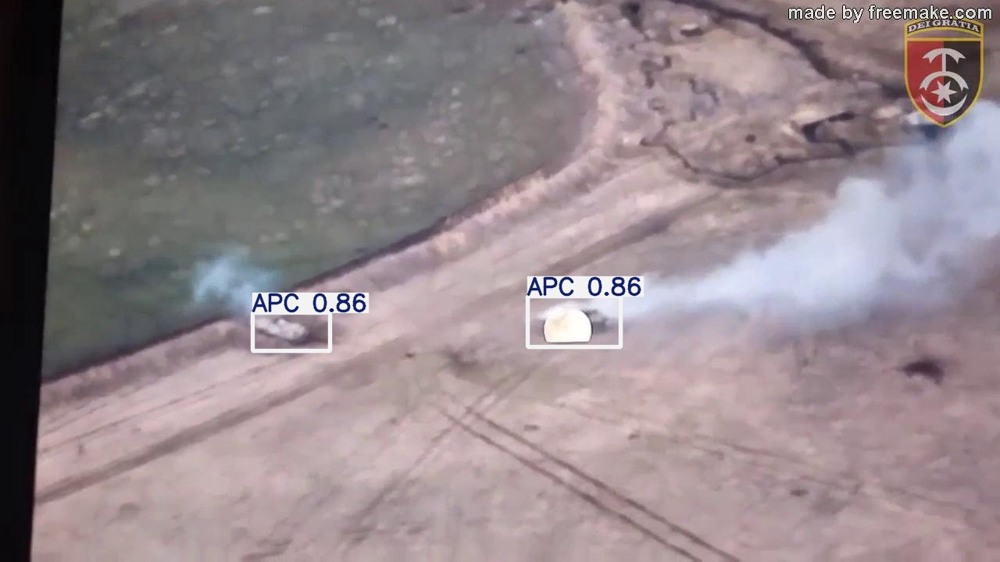

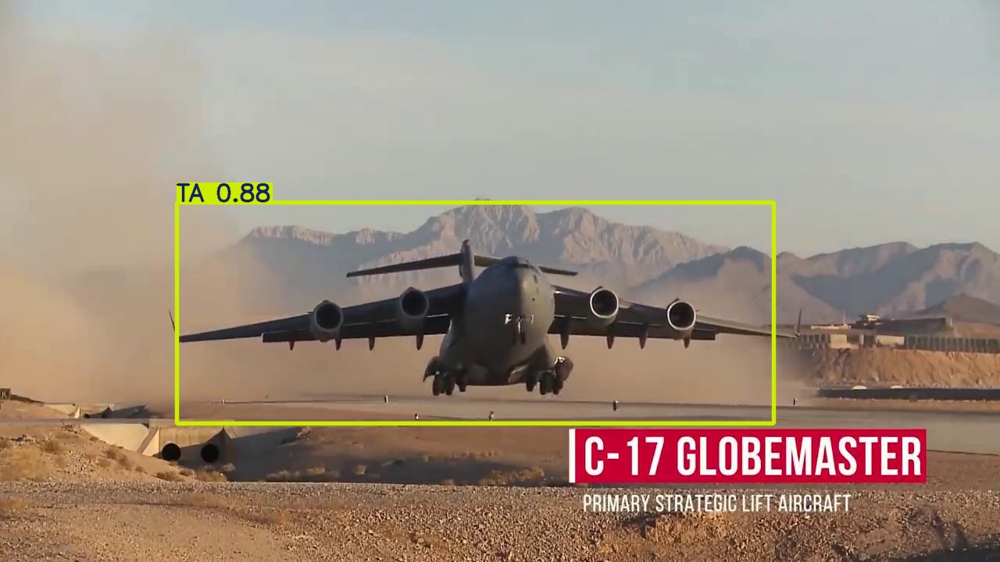

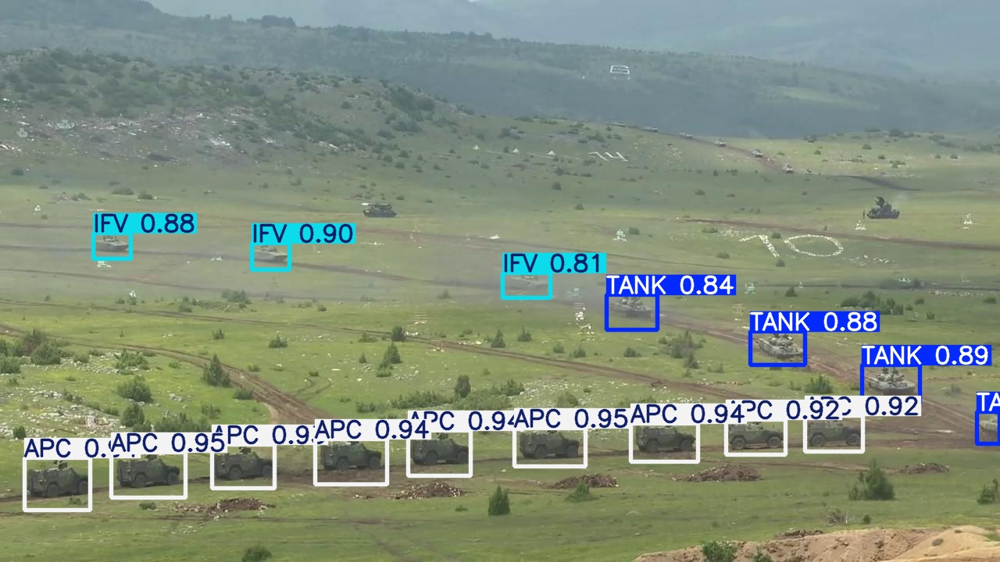

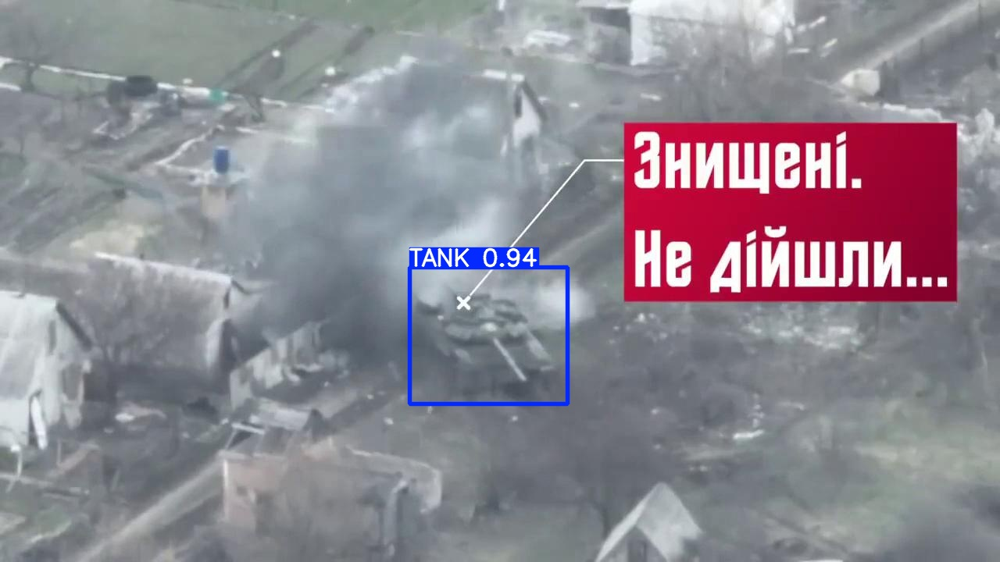

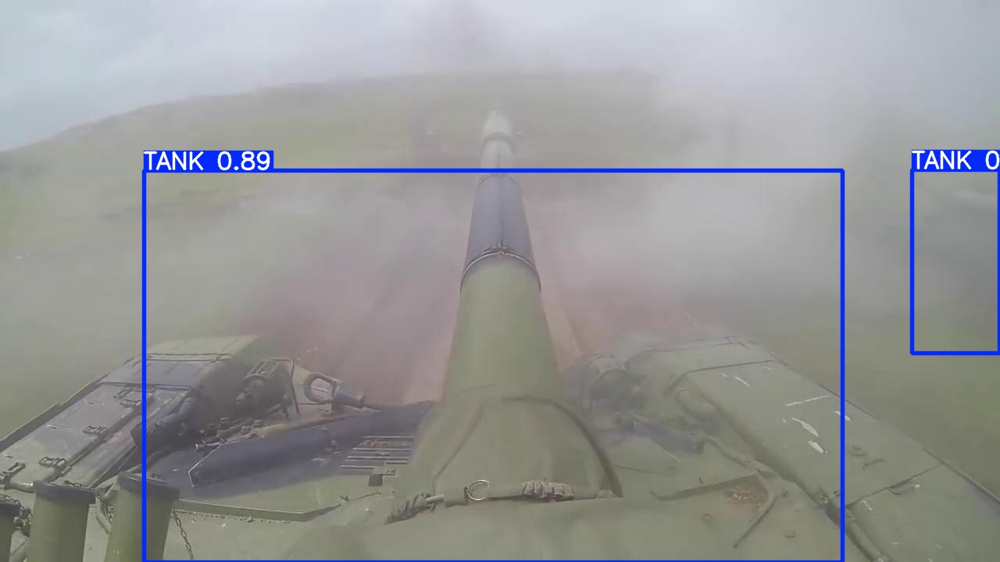

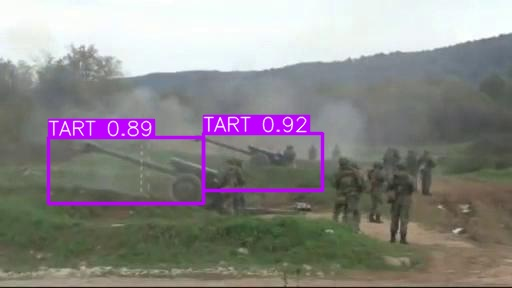

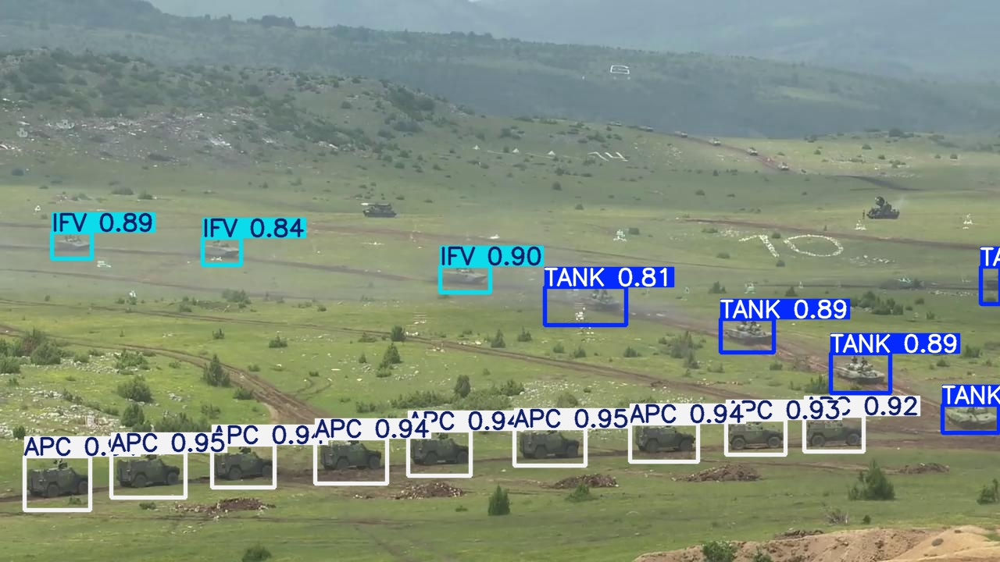

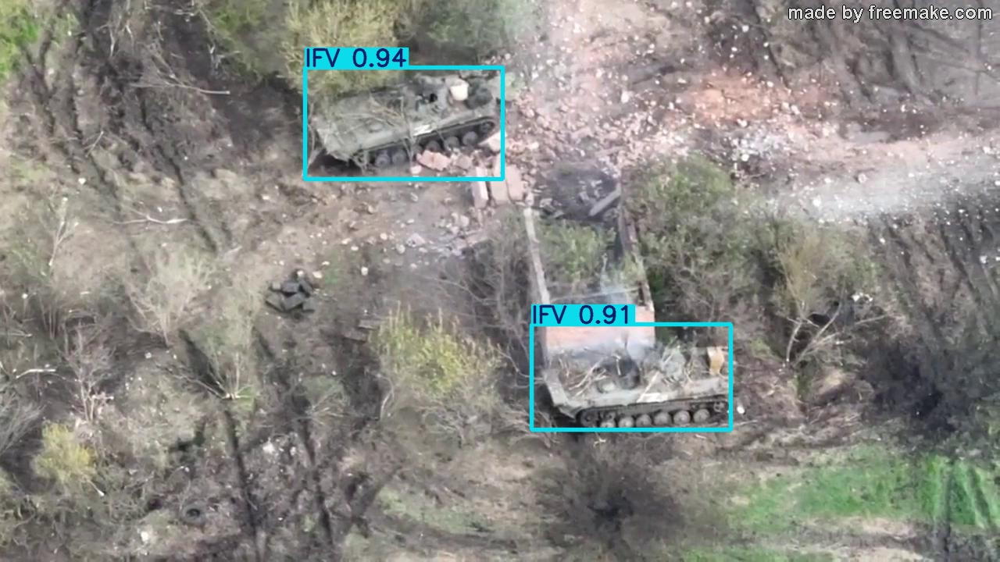

In [49]:
# Plot some predictions on the test images
from IPython.display import Image, display
import glob

for image_path in glob.glob(f'/kaggle/working/runs/detect/predict2/*.jpg')[:10]:
        display(Image(filename=image_path, width=600))
        print("\n")

The model demonstrates strong capability in detecting military vehicles. We can see on the examples above that performance may be slightly worse in scenarios where the vehicle is extremely small, obscured by smoke, or when the image resolution is very low. In such cases, the model's confidence may decrease, resulting in potential missed detections. However, these are instances where even human eyes find it challenging to detect the vehicle.

In [54]:
# Evaluate model performance on the test set
!yolo task=detect \
    mode=val \
    split=test \
    model=/kaggle/working/runs/detect/yolov8_military_vehicles/weights/best.pt \
    data=/kaggle/working/data.yaml

Ultralytics YOLOv8.2.39 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
Model summary (fused): 168 layers, 3007793 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /kaggle/input/datasetmilitaryequipment/test/labels... 3361 images,
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/test/images/1641.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0017]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/test/images/17718.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0172]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/test/images/17719.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0182]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/test/images/17729.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.024]
val: WARNING ⚠️ /kaggle/input/datasetmilitaryequipment/test/images/17742.jpg: ignori

The fine-tuned YOLOv8 model demonstrates strong performance across various classes on the test set, achieving an overall precision of 0.971 and recall of 0.961, with mAP50-95 of 0.824. The highest performance was achieved on the class EV: 0.997 precision, 0.998 recall, 0.925 mAP50-95. Classes TANk and IFV also have high performance metrics. However, some classes such as AH and AAP exhibit lower performance, possibly due to fewer instances in the dataset.

Overall, the model demonstrates its ability to handle varied conditions and detect instances with high accuracy across different IoU thresholds, as reflected in the mAP50-95 metric.

## Applications of Military Vehicles Object Detection

#### 1. Military Decision Making

Military vehicles object detection technologies significantly impact decision-making processes within military operations. These technologies provide critical real-time intelligence and situational awareness, enabling commanders to make informed and timely decisions on the battlefield. By accurately identifying and tracking military vehicles such as tanks, infantry fighting vehicles (IFVs), and helicopters, these detection systems facilitate:

- **Tactical Advantage**: Enhanced understanding of enemy movements and deployments allows for strategic positioning and operational planning.

- **Force Protection**: Early detection of threats improves soldier safety by enabling proactive measures against ambushes, attacks, and other hostile actions.

- **Target Prioritization**: Identification and classification of high-value targets enable precision targeting and efficient allocation of resources.

- **Mission Planning**: Integration of object detection data into mission planning processes optimizes routes, identifies chokepoints, and supports contingency planning.

#### 2. Analysis of Conflict Coverage in Media/News

Military vehicles object detection technologies not only impact military operations but also allow for analysis of how conflicts and wars are covered in media and news outlets. These technologies provide valuable insights that contribute to:

- **Comparative Studies**: Comparison of conflict coverage across different regions and media outlets provides insights into geopolitical trends, media biases, and global perspectives on warfare.

- **Visual Documentation**: Object detection systems archive visual evidence of military activities, contributing to historical documentation and analysis of conflict dynamics.

## Future Work

#### 1. Augmenting Data for Lower Represented Classes

Augmenting data for lower represented classes such as engineering vehicles and assault airplanes can enhance model robustness by expanding dataset diversity through additional image collection, data augmentation techniques, and synthetic data generation. 


#### 2. Analyzing Current Wars Coverage in News Media
Using the model to analyze media coverage of current wars offers opportunities to investigate 
temporal shifts in reporting styles, media bias, and the visual portrayal of military engagements. This analysis can provide valuable insights into public perception, international relations, and humanitarian responses influenced by media representations, contributing to advancements in both military operations and media studies.

#### 3. Hyperparameter optimization
Furhter hyperparameter optimization, including tuning learning rates, batch sizes, etc., could be performed for improving detection accuracy and efficiency.